In [1]:
# -*- coding: utf-8 -*-
import argparse
import numpy as np
import torch
import torch.nn as nn
import torch.backends.cudnn as cudnn
import pydicom
from timm.models import create_model
import utils
import modeling_pretrain
from einops import rearrange
from timm.data.constants import IMAGENET_DEFAULT_MEAN, IMAGENET_DEFAULT_STD
from transforms import *
from masking_generator import TubeMaskingGenerator, CAGMaskGenerator
import matplotlib.pyplot as plt

from skimage import exposure, img_as_ubyte
import cv2
from datasets import min_max_normalize, CAGDataAugmentationForVideoMAE, \
    build_pretraining_dataset
from run_mae_pretraining import get_args


/home/whikwon/miniconda3/envs/medssl/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
/home/whikwon/work/medssl/3rdparty/VideoMAE/modeling_finetune.py:293: UserWarning: Overwriting vit_small_patch16_224 in registry with modeling_finetune.vit_small_patch16_224. This is because the name being registered conflicts with an existing name. Please check if this is not expected.
  def vit_small_patch16_224(pretrained=False, **kwargs):
/home/whikwon/work/medssl/3rdparty/VideoMAE/modeling_finetune.py:302: UserWarning: Overwriting vit_base_patch16_224 in registry with modeling_finetune.vit_base_patch16_224. This is because the name being registered conflicts with an existing name. Please check if this is not expected.
  def vit_base_patch16_224(pretrained=False, **kwargs):
/home/whikwon/work/medssl/3rdparty/VideoMA

In [2]:
device = "cuda"
num_frames = 6
input_size = 512
device = torch.device(device)
cudnn.benchmark = True

model = create_model(
    "pretrain_videomae_base_patch32_512",
    pretrained=False,
    drop_path_rate=0.0,
    drop_block_rate=None,
    decoder_depth=4
)


pretrained_cfg=None


pretrained_cfg_overlay=None


kwargs={'drop_path_rate': 0.0, 'decoder_depth': 4}



img_size=512
patch_size=32




In [3]:
parser = argparse.ArgumentParser('VideoMAE pre-training script', add_help=False)
parser.add_argument('--batch_size', default=8, type=int)
parser.add_argument('--patch_size', default=32, type=int)
parser.add_argument('--num_frames', type=int, default=6)
parser.add_argument('--num_workers', default=4, type=int)

parser.add_argument('--mask_ratio', default=0.25, type=float,
                    help='ratio of the visual tokens/patches need be masked')
parser.add_argument('--data_path', default='./cag_ccta_1yr_xa_sampled.csv', type=str,
                    help='dataset path')
parser.add_argument('--pin_mem', action='store_true',
                    help='Pin CPU memory in DataLoader for more efficient (sometimes) transfer to GPU.')
args = parser.parse_args(args=[])


patch_size = model.encoder.patch_embed.patch_size
print("Patch size = %s" % str(patch_size))
window_size = (num_frames // 2, input_size // patch_size[0], input_size // patch_size[1])


args.window_size = (num_frames // 2, input_size // patch_size[0], input_size // patch_size[1])

Patch size = (32, 32)


## Check if augmentation was done correctly

In [4]:
dataset_train = build_pretraining_dataset(args)
num_tasks = utils.get_world_size()
global_rank = utils.get_rank()
sampler_rank = global_rank

sampler_train = torch.utils.data.DistributedSampler(
    dataset_train, num_replicas=num_tasks, rank=sampler_rank, shuffle=True
)

data_loader_train = torch.utils.data.DataLoader(
    dataset_train, sampler=sampler_train,
    batch_size=args.batch_size,
    num_workers=args.num_workers,
    pin_memory=args.pin_mem,
    drop_last=True,
    worker_init_fn=utils.seed_worker
)

Total number of train videos=200


In [16]:
for batch in data_loader_train:
    break
batch_images, batch_mask = batch

In [17]:
def draw_masked_area(images, mask, patch_size):
    # imagees.shape: (1, 6, 512, 512)
    # mask.shape: (768, )
    images = images.squeeze()

    mask_indices = np.where(mask[:len(mask) // 3])[0]

    H, W = images[0].shape
    board = np.zeros((H, W))

    num_patches_in_width = W // patch_size[0]
    for i in mask_indices:
        row_patch_idx = i // num_patches_in_width
        col_patch_idx = i % num_patches_in_width
        board[
            row_patch_idx * patch_size[1]:(row_patch_idx + 1) * patch_size[1],
            col_patch_idx * patch_size[0]:(col_patch_idx + 1) * patch_size[0]
        ] = 1
        
    return board        

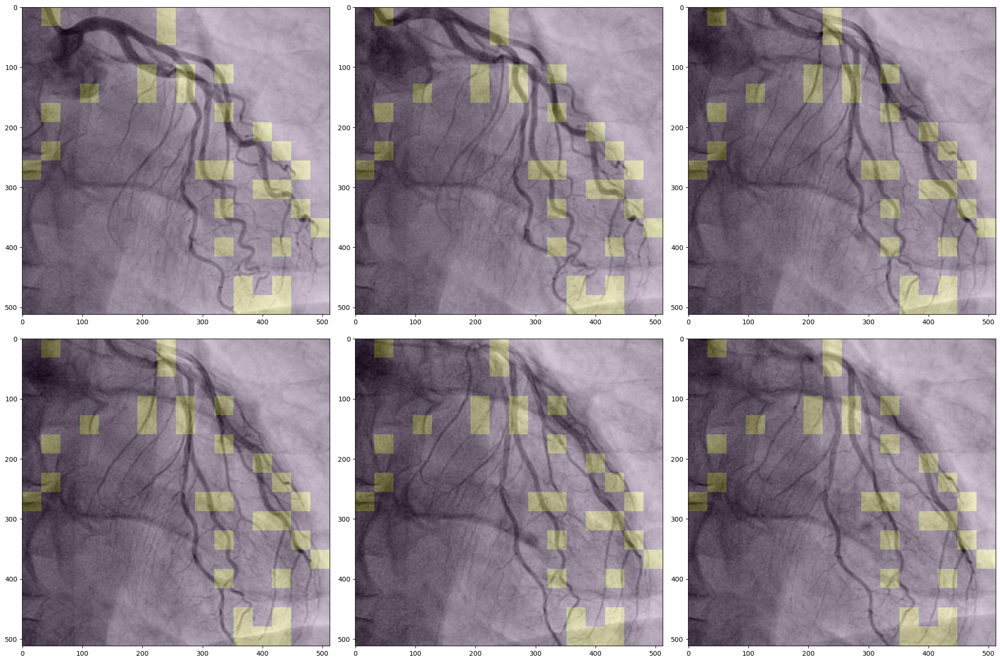

In [18]:
batch_idx = 7

mask = draw_masked_area(
    batch_images[batch_idx], 
    batch_mask[batch_idx],
    patch_size
)

fig, axes = plt.subplots(2, 3, figsize=(3*7, 2*7))
for i, image in enumerate(batch_images[batch_idx].squeeze()):
    row = i // 3
    col = i % 3
    axes[row][col].imshow(image, cmap='gray')
    axes[row][col].imshow(mask, alpha=0.2)
fig.tight_layout()

## Inference

In [35]:
# model_path = "./logs/canny_edge_mask_60/checkpoint-99.pth"
model_path = "./logs/checkpoint-49.pth"
# model_path = "./logs/checkpoint-399.pth"

dcm_path = "./14002719_20230308_XA_004.dcm"
frame_indices = np.arange(20, 32, 2)


# Load model
model.to(device)
checkpoint = torch.load(model_path, map_location='cpu')
model.load_state_dict(checkpoint['model'])
model.eval()


PretrainVisionTransformer(
  (encoder): PretrainVisionTransformerEncoder(
    (patch_embed): PatchEmbed(
      (proj): Conv3d(1, 768, kernel_size=(2, 32, 32), stride=(2, 32, 32))
    )
    (blocks): ModuleList(
      (0-11): 12 x Block(
        (norm1): LayerNorm((768,), eps=1e-06, elementwise_affine=True)
        (attn): Attention(
          (qkv): Linear(in_features=768, out_features=2304, bias=False)
          (attn_drop): Dropout(p=0.0, inplace=False)
          (proj): Linear(in_features=768, out_features=768, bias=True)
          (proj_drop): Dropout(p=0.0, inplace=False)
        )
        (drop_path): Identity()
        (norm2): LayerNorm((768,), eps=1e-06, elementwise_affine=True)
        (mlp): Mlp(
          (fc1): Linear(in_features=768, out_features=3072, bias=True)
          (act): GELU(approximate='none')
          (fc2): Linear(in_features=3072, out_features=768, bias=True)
          (drop): Dropout(p=0.0, inplace=False)
        )
      )
    )
    (norm): LayerNorm((768,

In [36]:
dcm = pydicom.dcmread(dcm_path)
buffer = dcm.pixel_array[frame_indices]

if buffer.dtype == np.uint16:
    buffer = img_as_ubyte(exposure.rescale_intensity(buffer))
rows = dcm.Rows
if rows != 512:
    resized_imgs = []
    for frame in buffer:
        resized_imgs.append(cv2.resize(frame, (512, 512)))
    buffer = np.array(resized_imgs)
buffer, (img_min, img_max) = min_max_normalize(buffer, return_minmax=True)

In [37]:
tube_masking_generator = TubeMaskingGenerator(
    (6 // 2, 512 // 32, 512 // 32), 0.5
)
bool_masked_pos = tube_masking_generator()
bool_masked_pos = torch.from_numpy(bool_masked_pos).to(torch.float)

buffer = torch.from_numpy(buffer.astype(np.float32)[None])  # add channel axis
with torch.no_grad():
    img = buffer.unsqueeze(0)
    img = img.to(device, non_blocking=True)

    bool_masked_pos = bool_masked_pos.unsqueeze(0)
    bool_masked_pos = bool_masked_pos.to(
        device, non_blocking=True).flatten(1).to(torch.bool)

    outputs = model(img, bool_masked_pos)


In [38]:
print(img.shape)
print(bool_masked_pos.shape)
print(outputs.shape)

torch.Size([1, 1, 6, 512, 512])
torch.Size([1, 768])
torch.Size([1, 384, 2048])


In [39]:
patch_size

(32, 32)

In [40]:
videos_patch = rearrange(
    img,
    'b c (t p0) (h p1) (w p2) -> b (t h w) (p0 p1 p2 c)',
    p0=2, p1=patch_size[0], p2=patch_size[1]
)
print(f"videos_patch.shape={videos_patch.shape}")
masked_videos_patch = videos_patch[bool_masked_pos]
print(f"masked_videos_patch.shape={masked_videos_patch.shape}")

videos_patch.shape=torch.Size([1, 768, 2048])
masked_videos_patch.shape=torch.Size([384, 2048])


In [41]:
outputs

tensor([[[0.4902, 0.4763, 0.5846,  ..., 0.4122, 0.5184, 0.4301],
         [0.4530, 0.4407, 0.6128,  ..., 0.4252, 0.5064, 0.4377],
         [0.4304, 0.3842, 0.6350,  ..., 0.4355, 0.5211, 0.4573],
         ...,
         [0.4159, 0.4036, 0.6007,  ..., 0.5937, 0.4838, 0.2070],
         [0.4101, 0.4412, 0.6071,  ..., 0.5711, 0.5083, 0.1809],
         [0.4098, 0.4680, 0.6087,  ..., 0.5549, 0.5209, 0.1611]]],
       device='cuda:0')

In [42]:
masked_img = videos_patch.clone()
masked_img[bool_masked_pos] = 0

masked_img = masked_img * (img_max - img_min) + img_min

print(masked_img.shape)
recon_masked_img = rearrange(
    masked_img,
    'b (t h w) (c p0 p1 p2) -> b c (t p0) (h p1) (w p2)', 
    b=1, c=1, p0=2, p1=patch_size[0], p2=patch_size[1],
    h=16, w=16
)
recon_masked_img = recon_masked_img.cpu().numpy()

torch.Size([1, 768, 2048])


In [43]:
masked_img = videos_patch.clone()
masked_img[bool_masked_pos] = outputs

masked_img = masked_img * (img_max - img_min) + img_min

print(masked_img.shape)
pred_recon_masked_img = rearrange(
    masked_img,
    'b (t h w) (c p0 p1 p2) -> b c (t p0) (h p1) (w p2)', 
    b=1, c=1, p0=2, p1=patch_size[0], p2=patch_size[1],
    h=16, w=16
)
pred_recon_masked_img = pred_recon_masked_img.cpu().numpy()

torch.Size([1, 768, 2048])


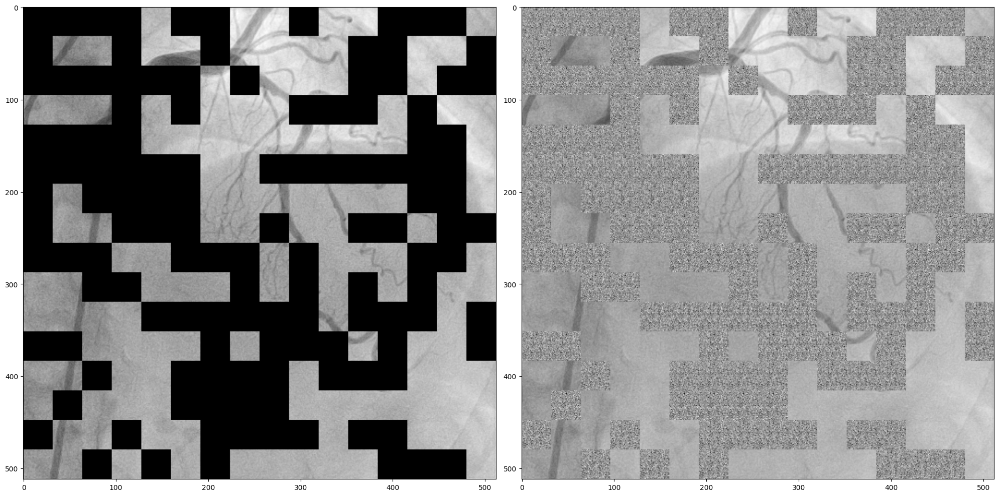

In [44]:
fig = plt.figure(figsize=(20, 10))

fig.add_subplot(1, 2, 1)
plt.imshow(recon_masked_img[0, 0, 3], cmap='gray')
fig.add_subplot(1, 2, 2)
plt.imshow(pred_recon_masked_img[0, 0, 3], cmap='gray')

fig.tight_layout()

In [48]:
loss_func = nn.MSELoss()
loss = loss_func(input=outputs, target=videos_patch[bool_masked_pos])
print(loss)


tensor(0.0338, device='cuda:0')


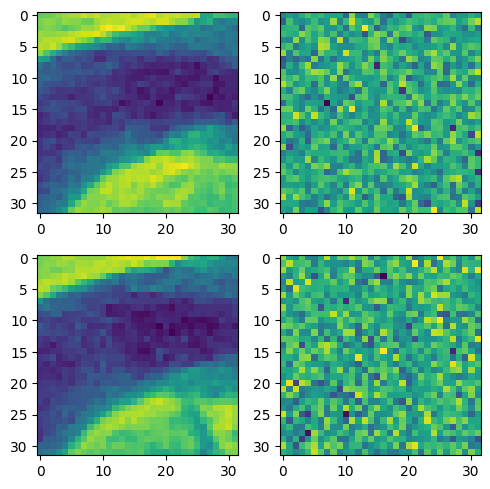

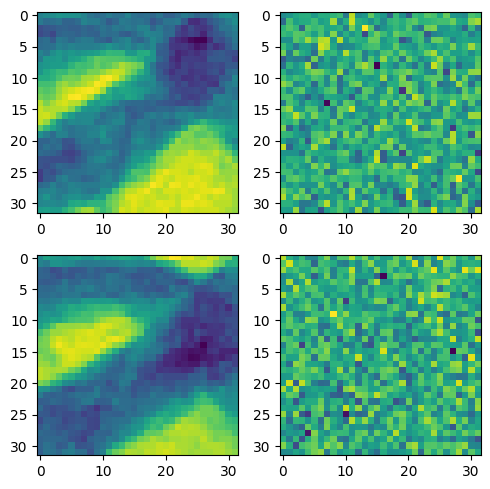

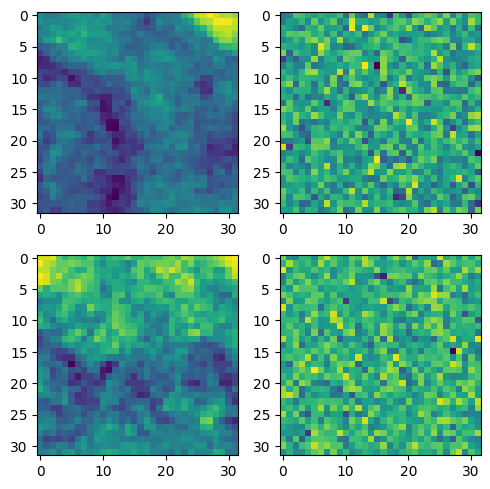

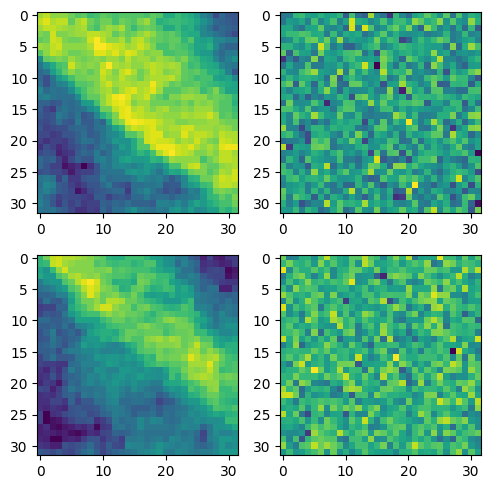

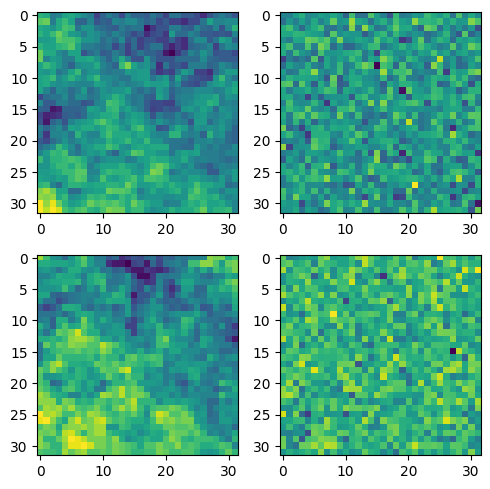

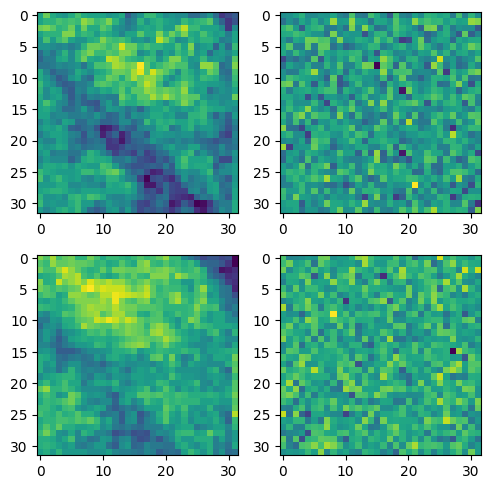

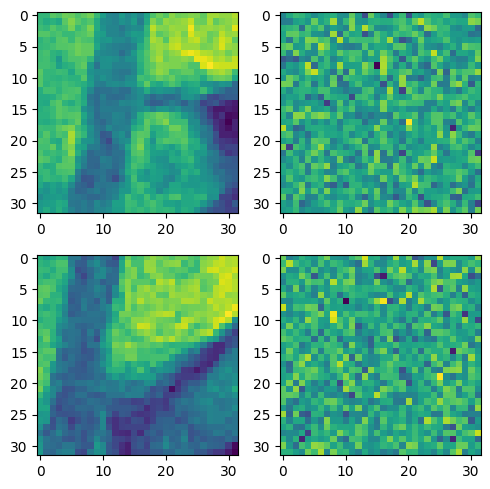

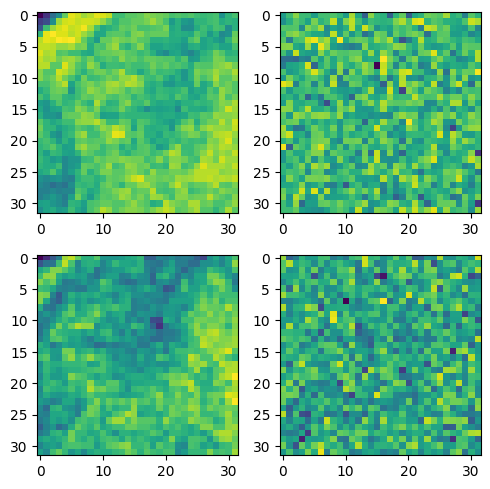

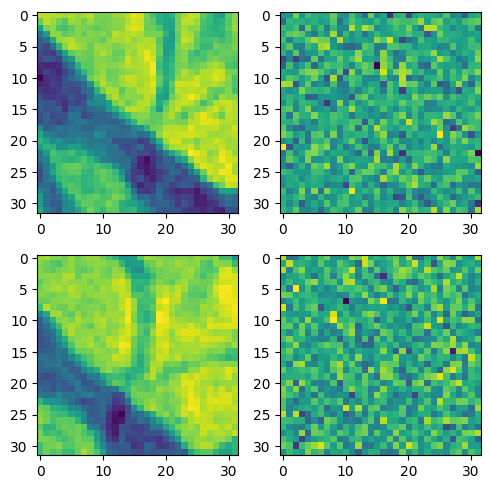

In [46]:
c = 0
for i, (o, p) in enumerate(zip(outputs[0], videos_patch[bool_masked_pos])):
    orig_patches = p.reshape(2, 32, 32).cpu()
    pred_patches = o.reshape(2, 32, 32).cpu()

    if i > 20 and i < 30:
        fig, axes = plt.subplots(2, 2, figsize=(5, 5))
        axes[0, 0].imshow(orig_patches[0])
        axes[0, 1].imshow(pred_patches[0])
        axes[1, 0].imshow(orig_patches[1])
        axes[1, 1].imshow(pred_patches[1])
        fig.tight_layout()
    

In [49]:
torch.mean(torch.sqrt((outputs - videos_patch[bool_masked_pos]) ** 2))

tensor(0.1463, device='cuda:0')

In [51]:
torch.mean(torch.sqrt((outputs - videos_patch[bool_masked_pos]) ** 2)) / args.batch_size

tensor(0.0183, device='cuda:0')

## 예상 결과

In [43]:
num_patches = (512 // 16) * (512 // 16)
masked_patch_indices = np.random.choice(
    num_patches, int(num_patches * 0.5),
    replace=False
)

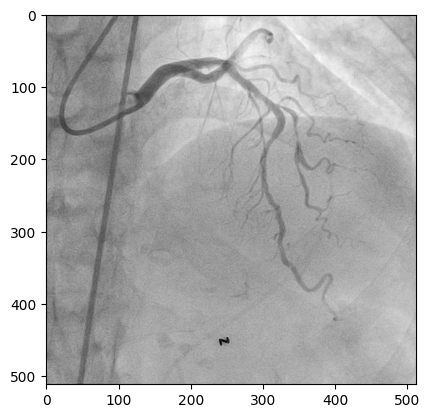

In [44]:
frame = buffer[0][0].cpu().numpy()
fig = plt.imshow(frame, cmap='gray')

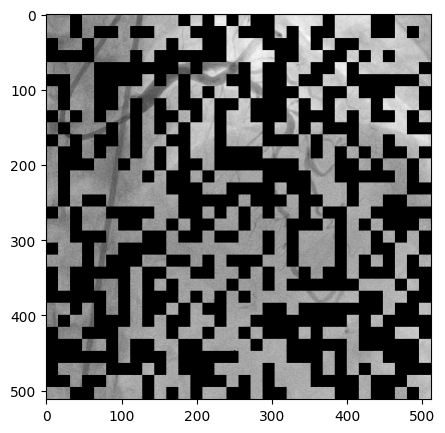

In [45]:
# def extract_patches(frame, masked_patch_indices):
masked_frame = frame.copy()
mask_img = np.zeros_like(frame)
masked_patches = []
for patch_idx in masked_patch_indices:
    row_idx = patch_idx // 32
    col_idx = patch_idx % 32

    y1 = 16 * row_idx
    x1 = 16 * col_idx
    masked_patches.append(frame[y1:y1+16, x1:x1+16])
    masked_frame[y1:y1+16, x1:x1+16] = 0
    mask_img[y1:y1+16, x1:x1+16] = 1

fig = plt.figure(figsize=(5, 5))
fig = plt.imshow(masked_frame, cmap='gray')

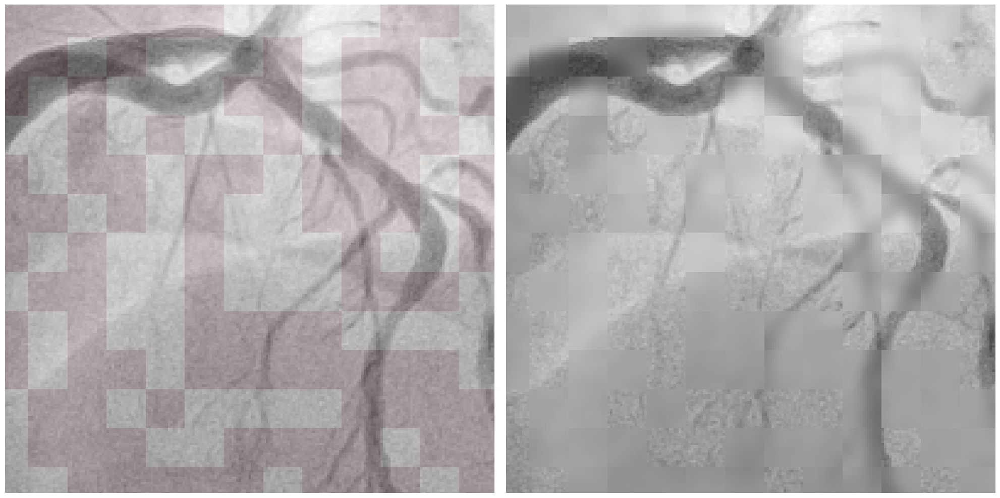

In [46]:
# def extract_patches(frame, masked_patch_indices):
recon_frame = masked_frame.copy()

for patch_idx, masked_patch in zip(masked_patch_indices, masked_patches):
    row_idx = patch_idx // 32
    col_idx = patch_idx % 32

    y1 = 16 * row_idx
    x1 = 16 * col_idx
    # recon_frame[y1:y1+16, x1:x1+16] = cv2.blur(masked_patch, (9, 9))
    recon_frame[y1:y1+16, x1:x1+16] = cv2.GaussianBlur(masked_patch, (15, 15), sigmaX = 0, sigmaY = 0)


fig = plt.figure(figsize=(20, 10))

fig.add_subplot(1, 2, 1)
plt.imshow(frame, cmap='gray')
plt.imshow(mask_img, cmap='Reds', alpha=0.1)
plt.xlim(150, 350)
plt.ylim(250, 50)
plt.axis('off')

fig.add_subplot(1, 2, 2)
plt.imshow(recon_frame, cmap='gray')
plt.xlim(150, 350)
plt.ylim(250, 50)
plt.axis('off')

fig.tight_layout()



In [49]:
loss_func = nn.MSELoss()
loss = loss_func(
    input=torch.from_numpy(frame),
    target=torch.from_numpy(recon_frame),
)
print(loss)

tensor(0.0003)


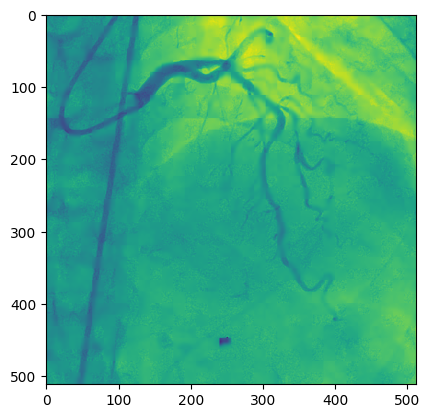

In [48]:
plt.imshow(recon_frame)

In [1]:
6 // 2 

3

## Edge detection

In [2]:
dcm_path = "./14002719_20230308_XA_004.dcm"
dcm = pydicom.dcmread(dcm_path)
frame = dcm.pixel_array[22]
next_frame = dcm.pixel_array[24]

img_blur = cv2.GaussianBlur(frame, (3, 3), 0) 
edges = cv2.Canny(
    image=img_blur, 
    threshold1=40, 
    threshold2=80
)  # Canny Edge Detection

In [6]:
input_size = 512
# patch_size = 16
patch_size = 32

width = (input_size // patch_size)
height = (input_size // patch_size)
num_patches = width * height

ys, xs = np.where(edges)
edge_coords = np.stack([xs, ys], axis=-1)
patch_coords = np.unique(edge_coords // patch_size, axis=0)

selected_coords_indices = np.random.choice(
    len(patch_coords),
    int(len(patch_coords) * 0.5),
    replace=False
)

mask = np.zeros_like(frame)
for (col_idx, row_idx) in patch_coords[selected_coords_indices]:
    y1 = patch_size * row_idx
    x1 = patch_size * col_idx
    mask[y1:y1+patch_size, x1:x1+patch_size] = 1


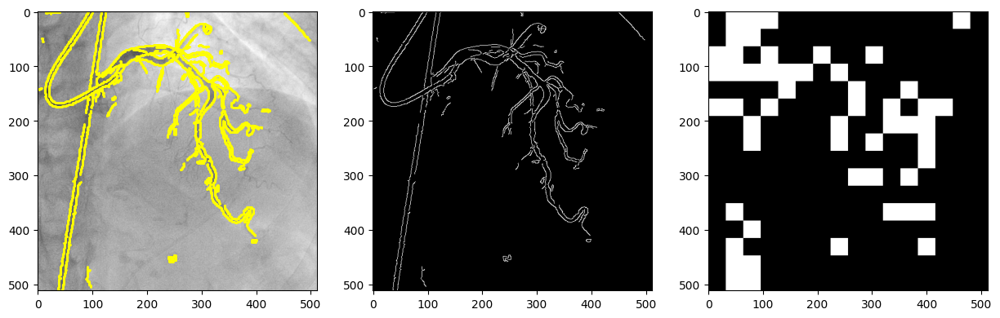

In [7]:
fig = plt.figure(figsize=(15, 5))
fig.add_subplot(1,3,1)
plt.imshow(frame, cmap='gray')
plt.scatter(*edge_coords.T, c='yellow', s=1)

fig.add_subplot(1,3,2)
plt.imshow(edges, cmap='gray')

fig.add_subplot(1,3,3)
plt.imshow(mask, cmap='gray')


In [8]:
selected_patch_indices = []
for col_patch_idx, row_patch_idx in patch_coords[selected_coords_indices]:
    selected_patch_idx = width * row_patch_idx + col_patch_idx
    selected_patch_indices.append(selected_patch_idx)



In [9]:
selected_patch_indices

[153,
 93,
 90,
 121,
 225,
 2,
 41,
 72,
 226,
 92,
 18,
 177,
 114,
 103,
 3,
 50,
 220,
 108,
 49,
 17,
 242,
 55,
 209,
 187,
 98,
 48,
 107,
 241,
 68,
 188,
 81,
 83,
 51,
 14,
 53,
 215,
 32,
 155,
 119,
 52,
 186,
 75,
 124,
 38,
 140,
 1,
 106,
 88,
 152,
 33,
 194,
 80,
 35]

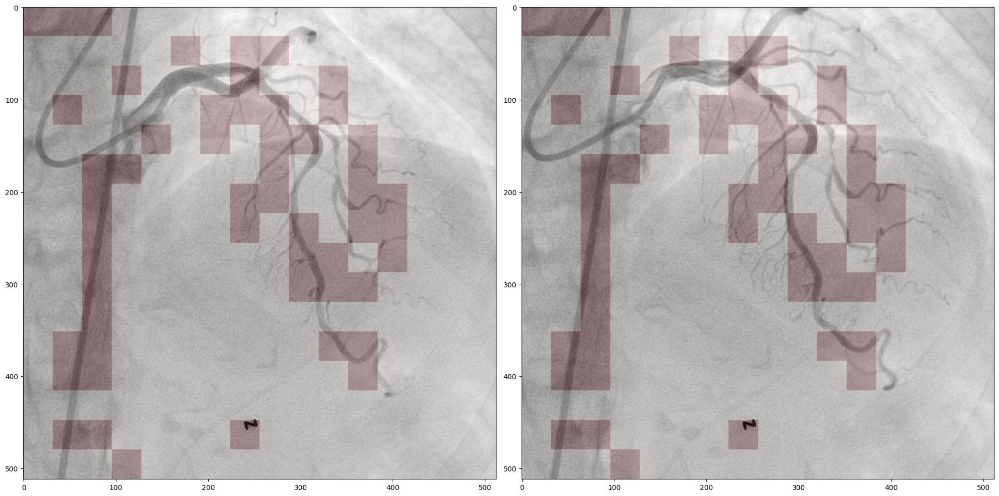

In [10]:
fig = plt.figure(figsize=(20, 10))
fig.add_subplot(1,2,1)
plt.imshow(frame, cmap='gray')
plt.imshow(mask, cmap='Reds', alpha=0.2)

fig.add_subplot(1,2,2)
plt.imshow(next_frame, cmap='gray')
plt.imshow(mask, cmap='Reds', alpha=0.2)

fig.tight_layout()
# fig.add_subplot(1,2,2)
# plt.imshow(edges, cmap='gray')
# plt.imshow(mask, cmap='bone', alpha=0.5)

In [14]:
bool_masked_pos.shape

torch.Size([1, 3072])

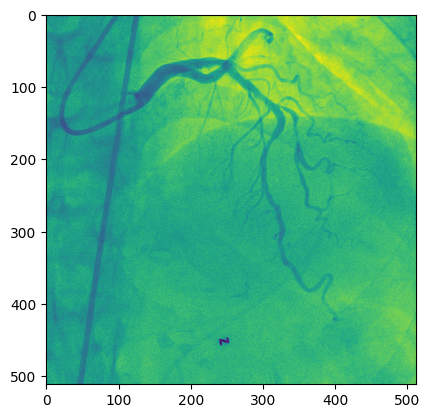

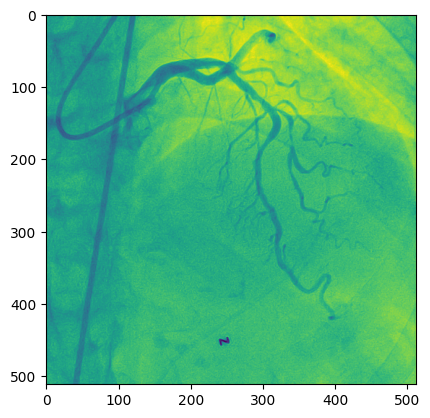

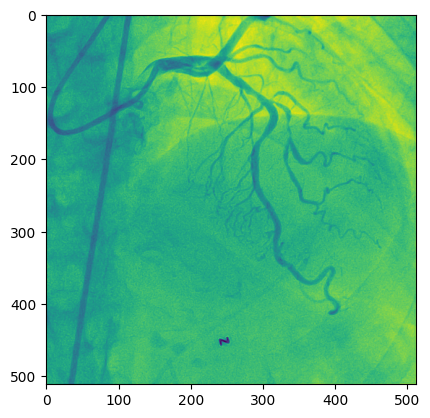

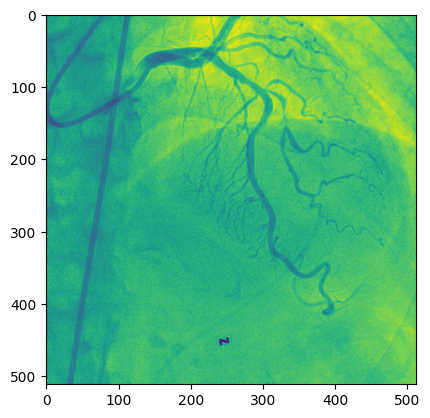

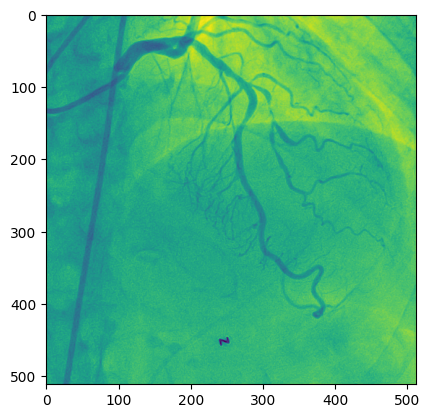

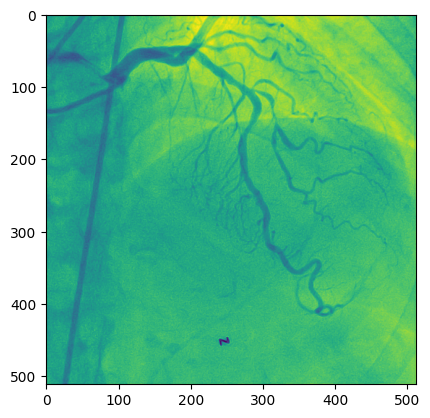

In [75]:
for i in frame_indices:
    fig = plt.figure()
    plt.imshow(dcm.pixel_array[i])

In [72]:
frame_indices

array([20, 22, 24, 26, 28, 30])

In [39]:
edge_coords[0]

array([ 0, 92])

In [40]:
xs[0]

0

In [13]:
tube_masking_generator = TubeMaskingGenerator(
    (3, 224//16, 224//16), 0.75
)
mask = tube_masking_generator()

In [21]:
np.all(mask[:196] == mask[196:196*2])

True



# of patches per frame:  64


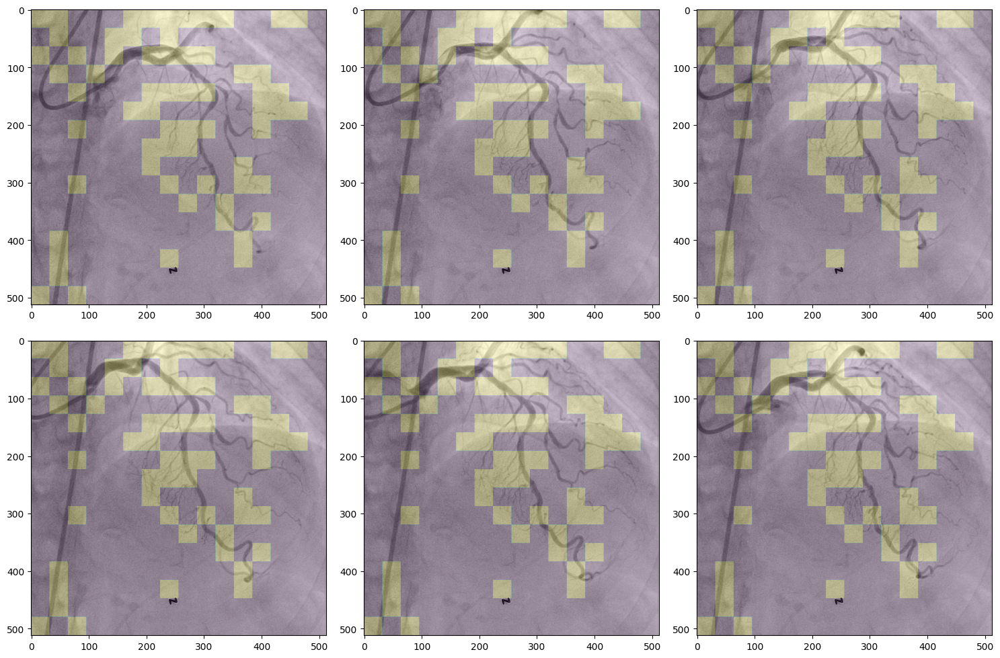

In [3]:
dcm_path = "./14002719_20230308_XA_004.dcm"
dcm = pydicom.dcmread(dcm_path)

input_size = 512
patch_size = 32
num_frames = 6

images = dcm.pixel_array[22:22+12:2]
mask_generator = CAGMaskGenerator(
    patch_size,
    (num_frames // 2, input_size // patch_size, input_size // patch_size),
    mask_ratio=0.5
)
masks = mask_generator(images)
mask_indices = masks[:mask_generator.num_patches_per_frame]



mask = np.zeros_like(images[0])
for i in np.where(mask_indices)[0]:
    row_patch_idx = i // mask_generator.width
    col_patch_idx = i % mask_generator.width
    y1 = row_patch_idx * patch_size
    x1 = col_patch_idx * patch_size
    mask[
        y1:y1 + patch_size,
        x1:x1 + patch_size] = 1


fig, axes = plt.subplots(2, 3, figsize=(3*5, 2*5))
for i, image in enumerate(images):
    row = i // 3
    col = i % 3
    axes[row][col].imshow(image, cmap='gray')
    axes[row][col].imshow(mask, alpha=0.2)
fig.tight_layout()

In [4]:
np.concatenate([np.array([1,2,3]), [4,5,6]])

array([1, 2, 3, 4, 5, 6])